In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
cd /content/drive/MyDrive/SF_LAB_2/Video\ Forensics

/content/drive/MyDrive/SF_LAB_2/Video Forensics


In [3]:
!pwd
!ls

/content/drive/MyDrive/SF_LAB_2/Video Forensics
 17CS02011_report4.gdoc		       original_frames_blockwise_list.txt
 17CS02011_Video_Forensics.ipynb       original_frames.txt
 6fps.mp4			       pyflow
 forge_50.txt			       real_30.txt
 forged_frames_blockwise_array.txt    'Realman street_10_5.mp4'
 forged_frames_blockwise_list.txt     'Real man street _5sec.mp4'
 forged_frames.txt		      'Real man street.mp4'
'Forgeryman street_10_5.mp4'	       Real_passport_1s.mp4
'Forgery man street_5sec.mp4'	      'Real Passport.mp4'
'Forgery man street.mp4'	       real.txt
 forgery_original_1.txt		       temp1.pdf
 forgery_original_.txt		      'Video Forensics.ipynb'
'Forgery Passport.mp4'		       video_pro2.avi
 forge.txt			       v_out_4-2-2015-23-58-0.avi
 lena512.bmp			       v_out_5-2-2015-0-0-8.avi
 man_original.txt		       v_out_5-2-2015-0-2-14.avi
 original_frames_blockwise_array.txt


In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

In [ ]:
hpf = [1,-3,3,-1]
def find_residuals(img,hpf,t,q):
  r_height = img.shape[0]
  r_width = img.shape[1]-len(hpf)+1
  result = np.zeros((r_height,r_width))
  height = img.shape[0]
  width = img.shape[1]
  for i in range(height):
    for j in range(width):
      if(j+len(hpf)>width):
        continue
      result[i,j] = min(t,max(-1*t,((hpf * img[i,j:j+len(hpf)]).sum())//q))
  return result

In [ ]:
residual_values = [-2,-1,0,1,2]
def count_co_occurences(img_residuals,residual_values,n):
  import itertools
  co_occurences = dict.fromkeys(list(itertools.product(residual_values,repeat=n)), 0)

  height = img_residuals.shape[0]
  width = img_residuals.shape[1]
  for i in range(height):
    for j in range(width):
      if(j+n>width):
        continue
      current_tuple = (img_residuals[i,j],img_residuals[i,j+1],img_residuals[i,j+2],img_residuals[i,j+3])
      #print(current_tuple,end=' ')
      #print(co_occurences[current_tuple],end=' ')
      co_occurences[current_tuple] +=1
      #print(co_occurences[current_tuple],end='\n')
  return co_occurences

In [ ]:
def reducing_symmetrically(co_occurences):
  result = co_occurences.copy()
  #count = 0
  for k, v in co_occurences.items():
    # Paindrome
    mirror_key = (k[3],k[2],k[1],k[0])
    # if(count==325):
    #   break
    if k not in result:
      continue
    if(k[0]==k[3] and k[1]==k[2]):
      #print(k)
      #count +=1
      continue
    else:
      result[k] = result[k] + co_occurences[(k[3],k[2],k[1],k[0])]
      result.pop(mirror_key)
      #count +=1 
  return result

In [ ]:
def cal_statistical(image):
  row_rls = find_residuals(image,hpf,2,3)
  col_rls = np.transpose(find_residuals(np.transpose(image),hpf,2,3)) 
  row_rls_i = row_rls.astype('int')
  col_rls_i = col_rls.astype('int') 
  row_rls_co = count_co_occurences(row_rls_i,residual_values,4)
  col_rls_co = count_co_occurences(col_rls_i,residual_values,4) 
  row_rls_sco = reducing_symmetrically(row_rls_co)
  col_rls_sco = reducing_symmetrically(col_rls_co)
  # plt.figure(figsize=(20,5))
  # plt.subplot(121)
  # plt.bar(range(len(row_rls_sco)), list(row_rls_sco.values()), align='center')
  # plt.title('Row-wise')
  # plt.subplot(122)
  # plt.bar(range(len(col_rls_sco)), list(col_rls_sco.values()), align='center')
  # plt.title('Column-Wise')
  # plt.show()
  return (row_rls_sco,col_rls_sco)

# Working with single Image

(512, 512)


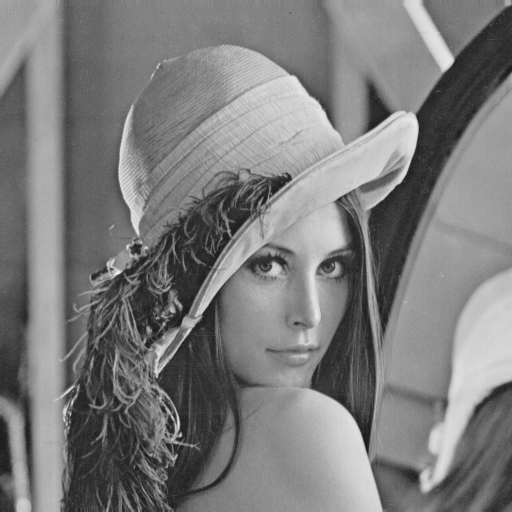

In [ ]:
import cv2

img = cv2.imread('lena512.bmp',0)
img_copy = img.copy()
#img = cv2.resize(img, (512, 512))      
#imf = img.astype('float')
#dct = np.zeros(imf.shape)
print(img.shape)
cv2_imshow(img)

In [ ]:
# Finding Only Residuals
row_rls = find_residuals(img,hpf,2,3)
col_rls = np.transpose(find_residuals(np.transpose(img),hpf,2,3))
print(row_rls.shape)
print(row_rls)
print(col_rls.shape)
print(col_rls)  
row_rls_i = row_rls.astype('int')
col_rls_i = col_rls.astype('int')  

(512, 509)
[[ 0. -1.  2. ...  1.  2. -1.]
 [ 0. -1.  2. ...  1.  2. -1.]
 [ 0. -1.  2. ...  1.  2. -1.]
 ...
 [ 2. -2.  2. ...  0.  2. -2.]
 [ 2. -2.  2. ... -2.  2. -2.]
 [ 2.  2. -2. ... -2.  2. -2.]]
(509, 512)
[[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [-1. -1.  1. ...  2.  2.  2.]
 ...
 [-2. -2.  2. ...  2.  0.  2.]
 [ 0.  0. -2. ... -2. -2. -2.]
 [ 1.  1.  2. ... -1.  2.  2.]]


In [ ]:
# Finding Co-Occurences
row_rls_co = count_co_occurences(row_rls_i,residual_values,4)
col_rls_co = count_co_occurences(col_rls_i,residual_values,4)
print(len(row_rls_co),len(col_rls_co))
print(row_rls_co,'\n',col_rls_co)

625 625
{(-2, -2, -2, -2): 142, (-2, -2, -2, -1): 28, (-2, -2, -2, 0): 52, (-2, -2, -2, 1): 38, (-2, -2, -2, 2): 1266, (-2, -2, -1, -2): 54, (-2, -2, -1, -1): 20, (-2, -2, -1, 0): 17, (-2, -2, -1, 1): 30, (-2, -2, -1, 2): 303, (-2, -2, 0, -2): 89, (-2, -2, 0, -1): 47, (-2, -2, 0, 0): 58, (-2, -2, 0, 1): 76, (-2, -2, 0, 2): 437, (-2, -2, 1, -2): 154, (-2, -2, 1, -1): 92, (-2, -2, 1, 0): 124, (-2, -2, 1, 1): 136, (-2, -2, 1, 2): 392, (-2, -2, 2, -2): 6624, (-2, -2, 2, -1): 873, (-2, -2, 2, 0): 751, (-2, -2, 2, 1): 570, (-2, -2, 2, 2): 2643, (-2, -1, -2, -2): 56, (-2, -1, -2, -1): 22, (-2, -1, -2, 0): 28, (-2, -1, -2, 1): 45, (-2, -1, -2, 2): 576, (-2, -1, -1, -2): 46, (-2, -1, -1, -1): 35, (-2, -1, -1, 0): 47, (-2, -1, -1, 1): 70, (-2, -1, -1, 2): 295, (-2, -1, 0, -2): 111, (-2, -1, 0, -1): 109, (-2, -1, 0, 0): 137, (-2, -1, 0, 1): 149, (-2, -1, 0, 2): 250, (-2, -1, 1, -2): 285, (-2, -1, 1, -1): 213, (-2, -1, 1, 0): 198, (-2, -1, 1, 1): 141, (-2, -1, 1, 2): 169, (-2, -1, 2, -2): 2653, (-

In [ ]:
# Above return 625 values now we have to reduce to 35 taking symmetry into consideratino
row_rls_sco = reducing_symmetrically(row_rls_co)
col_rls_sco = reducing_symmetrically(col_rls_co)
print(len(row_rls_sco),len(col_rls_sco))
print(row_rls_sco,'\n',col_rls_sco)

325 325
{(-2, -2, -2, -2): 142, (-2, -2, -2, -1): 63, (-2, -2, -2, 0): 106, (-2, -2, -2, 1): 93, (-2, -2, -2, 2): 2507, (-2, -2, -1, -2): 110, (-2, -2, -1, -1): 46, (-2, -2, -1, 0): 53, (-2, -2, -1, 1): 80, (-2, -2, -1, 2): 623, (-2, -2, 0, -2): 190, (-2, -2, 0, -1): 93, (-2, -2, 0, 0): 128, (-2, -2, 0, 1): 154, (-2, -2, 0, 2): 857, (-2, -2, 1, -2): 336, (-2, -2, 1, -1): 190, (-2, -2, 1, 0): 231, (-2, -2, 1, 1): 278, (-2, -2, 1, 2): 776, (-2, -2, 2, -2): 13074, (-2, -2, 2, -1): 1805, (-2, -2, 2, 0): 1509, (-2, -2, 2, 1): 1160, (-2, -2, 2, 2): 5281, (-2, -1, -2, -1): 41, (-2, -1, -2, 0): 72, (-2, -1, -2, 1): 89, (-2, -1, -2, 2): 1141, (-2, -1, -1, -2): 46, (-2, -1, -1, -1): 63, (-2, -1, -1, 0): 88, (-2, -1, -1, 1): 154, (-2, -1, -1, 2): 586, (-2, -1, 0, -2): 218, (-2, -1, 0, -1): 204, (-2, -1, 0, 0): 284, (-2, -1, 0, 1): 285, (-2, -1, 0, 2): 514, (-2, -1, 1, -2): 561, (-2, -1, 1, -1): 416, (-2, -1, 1, 0): 385, (-2, -1, 1, 1): 240, (-2, -1, 1, 2): 335, (-2, -1, 2, -2): 5173, (-2, -1, 2, 

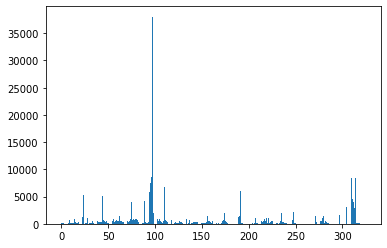

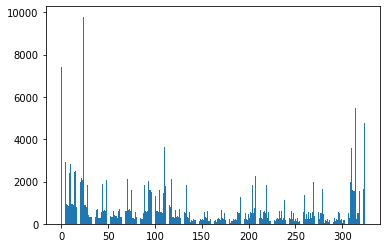

In [ ]:
plt.bar(range(len(row_rls_sco)), list(row_rls_sco.values()), align='center')
plt.show()
plt.bar(range(len(col_rls_sco)), list(col_rls_sco.values()), align='center')
plt.show()

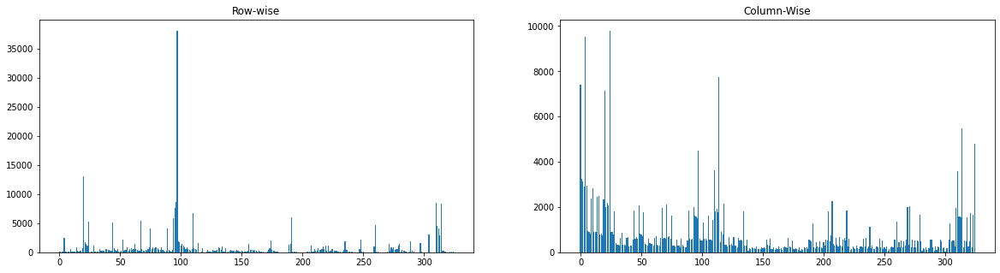

In [ ]:
row_cos,col_cos = cal_histograms(img)

In [ ]:
print(row_cos)
print(col_cos)

{(-2, -2, -2, -2): 142, (-2, -2, -2, -1): 63, (-2, -2, -2, 0): 106, (-2, -2, -2, 1): 93, (-2, -2, -2, 2): 2507, (-2, -2, -1, -2): 110, (-2, -2, -1, -1): 46, (-2, -2, -1, 0): 53, (-2, -2, -1, 1): 80, (-2, -2, -1, 2): 623, (-2, -2, 0, -2): 190, (-2, -2, 0, -1): 93, (-2, -2, 0, 0): 128, (-2, -2, 0, 1): 154, (-2, -2, 0, 2): 857, (-2, -2, 1, -2): 336, (-2, -2, 1, -1): 190, (-2, -2, 1, 0): 231, (-2, -2, 1, 1): 278, (-2, -2, 1, 2): 776, (-2, -2, 2, -2): 13074, (-2, -2, 2, -1): 1805, (-2, -2, 2, 0): 1509, (-2, -2, 2, 1): 1160, (-2, -2, 2, 2): 5281, (-2, -1, -2, -1): 41, (-2, -1, -2, 0): 72, (-2, -1, -2, 1): 89, (-2, -1, -2, 2): 1141, (-2, -1, -1, -2): 46, (-2, -1, -1, -1): 63, (-2, -1, -1, 0): 88, (-2, -1, -1, 1): 154, (-2, -1, -1, 2): 586, (-2, -1, 0, -2): 218, (-2, -1, 0, -1): 204, (-2, -1, 0, 0): 284, (-2, -1, 0, 1): 285, (-2, -1, 0, 2): 514, (-2, -1, 1, -2): 561, (-2, -1, 1, -1): 416, (-2, -1, 1, 0): 385, (-2, -1, 1, 1): 240, (-2, -1, 1, 2): 335, (-2, -1, 2, -2): 5173, (-2, -1, 2, -1): 658

# Video Forensics

In [ ]:
def video_metadata(video_file):
  cap1 = cv2.VideoCapture(video_file)
  length1 = int(cap1.get(cv2.CAP_PROP_FRAME_COUNT))
  width1  = int(cap1.get(cv2.CAP_PROP_FRAME_WIDTH))
  height1 = int(cap1.get(cv2.CAP_PROP_FRAME_HEIGHT))
  fps1    = cap1.get(cv2.CAP_PROP_FPS)

  print(length1,height1,width1,fps1)

  ret1, frame11 = cap1.read()
  cap1.release()

  return
  

In [ ]:
video_metadata("video_pro2.avi")
video_metadata("v_out_4-2-2015-23-58-0.avi")
video_metadata("v_out_5-2-2015-0-0-8.avi")
video_metadata("v_out_5-2-2015-0-2-14.avi")

390 576 768 30.0
334 576 768 25.0
334 576 768 25.0
334 576 768 25.0


In [ ]:
def video_visualisation(video_file_1,video_file_2):
  cap1 = cv2.VideoCapture(video_file_1)
  cap2 = cv2.VideoCapture(video_file_2)

  
  ret1, frame1 = cap1.read()
  ret2, frame2 = cap2.read()
  count = 0
  while(1):
    ret1,frame1 = cap1.read()
    ret2,frame2 = cap2.read()
    if(ret1 is False or ret2 is False):# or count==n_frames):
      break
    elif(count==100):
      # next = cv2.cvtColor(frame2,cv2.COLOR_BGR2GRAY)
      cv2_imshow(frame1)
      #plt.show()
    elif(count==70):
      cv2_imshow(frame2)
    count = count + 1
    #features.append(current_frame_features)
  cap1.release()
  cap2.release()
  cv2.destroyAllWindows()

  return

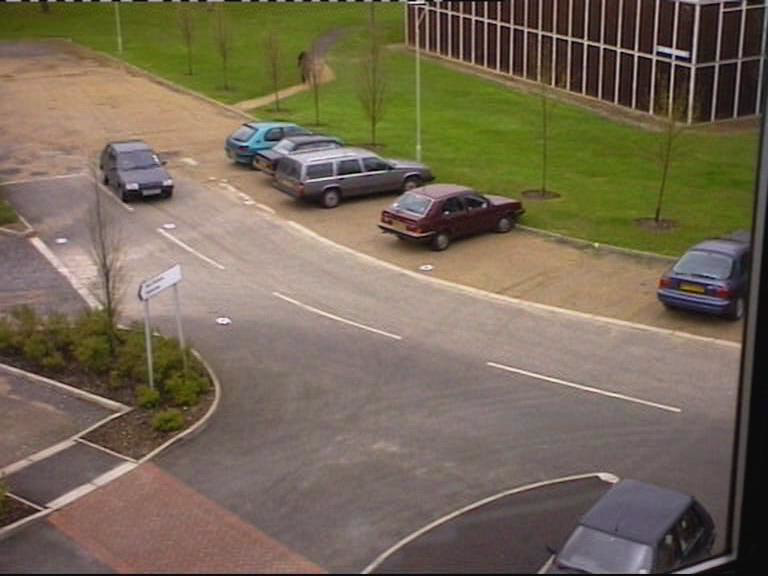

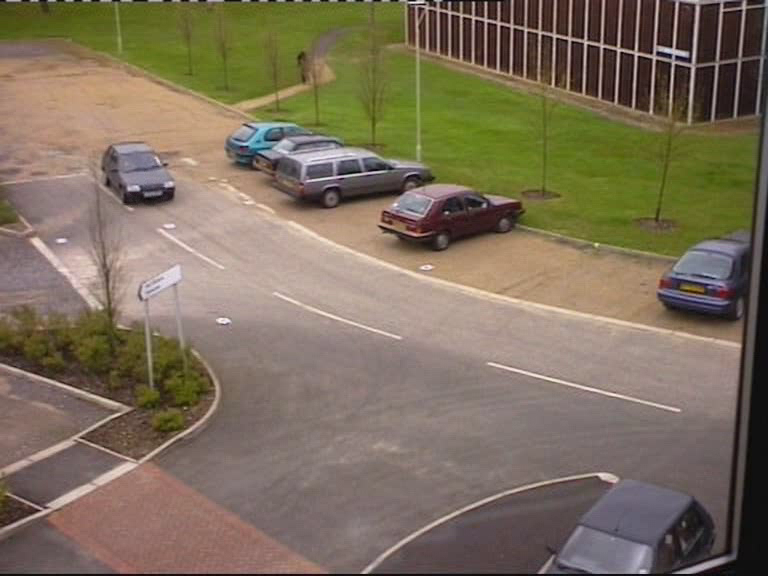

In [ ]:
video_visualisation("video_pro2.avi","v_out_4-2-2015-23-58-0.avi")

In [ ]:
def store_frames(video_file_1,video_file_2):
  cap1 = cv2.VideoCapture(video_file_1)
  cap2 = cv2.VideoCapture(video_file_2)

  
  ret1, frame1 = cap1.read()
  ret2, frame2 = cap2.read()
  count = 0
  original_frames = []
  forged_frames = []
  while(1):
    ret1,frame1 = cap1.read()
    ret2,frame2 = cap2.read()
    if(ret1 is False or ret2 is False):# or count==n_frames):
      break
    if(count==8 or count==20 or count==30 or count==65):
      forged_frames.append(frame2)
      print("forged",count)
      cv2_imshow(frame2)
      if(count==20):
        print("original",count)
        original_frames.append(frame1)
    elif(count==9 or count==21 or count==31 or count==66):
      forged_frames.append(frame2)
      print("forged",count)
      # cv2_imshow(frame2)
    elif(count==19 or count==43 or count==47 or count==90):
      original_frames.append(frame1)
      # next = cv2.cvtColor(frame2,cv2.COLOR_BGR2GRAY)
      print("original",count)
      cv2_imshow(frame1)
    elif(count==44 or count==48 or count==91):
      original_frames.append(frame1)
      # next = cv2.cvtColor(frame2,cv2.COLOR_BGR2GRAY)
      print("original",count)
      #plt.show()
    count = count + 1
    #features.append(current_frame_features)
  cap1.release()
  cap2.release()
  cv2.destroyAllWindows()

  return (original_frames,forged_frames)

In [ ]:
def store_frames(video_file_1,video_file_2):
  cap1 = cv2.VideoCapture(video_file_1)
  cap2 = cv2.VideoCapture(video_file_2)

  
  ret1, frame1 = cap1.read()
  ret2, frame2 = cap2.read()
  count = 0
  original_frames = []
  forged_frames = []
  while(1):
    ret1,frame1 = cap1.read()
    ret2,frame2 = cap2.read()
    if(ret1 is False or ret2 is False):# or count==n_frames):
      break
    if(count==8 or count==20 or count==30 or count==65):
      forged_frames.append(frame2)
      print("forged",count)
      cv2_imshow(frame2)
      if(count==20):
        print("original",count)
        original_frames.append(frame1)
    elif(count==9 or count==21 or count==31 or count==66):
      forged_frames.append(frame2)
      print("forged",count)
      # cv2_imshow(frame2)
    elif(count==19 or count==43 or count==47 or count==90):
      original_frames.append(frame1)
      # next = cv2.cvtColor(frame2,cv2.COLOR_BGR2GRAY)
      print("original",count)
      cv2_imshow(frame1)
    elif(count==44 or count==48 or count==91):
      original_frames.append(frame1)
      # next = cv2.cvtColor(frame2,cv2.COLOR_BGR2GRAY)
      print("original",count)
      #plt.show()
    count = count + 1
    #features.append(current_frame_features)
  cap1.release()
  cap2.release()
  cv2.destroyAllWindows()

  return (original_frames,forged_frames)

forged 8


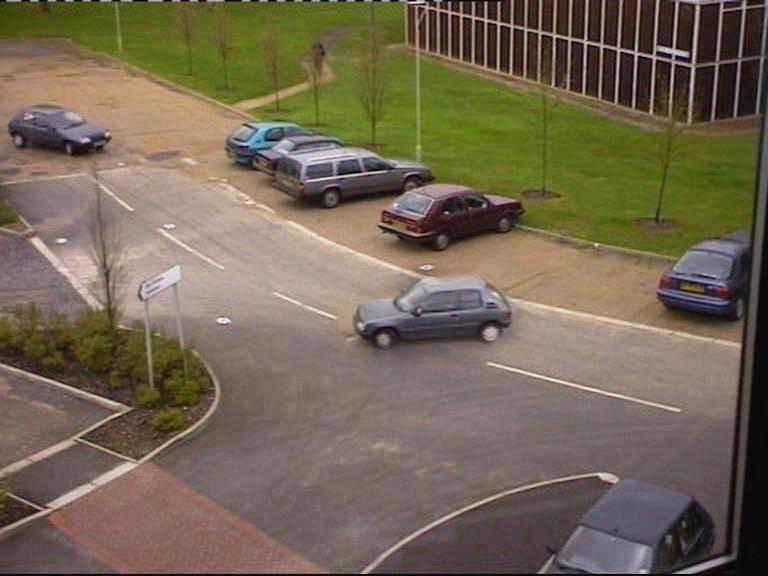

forged 9
original 19


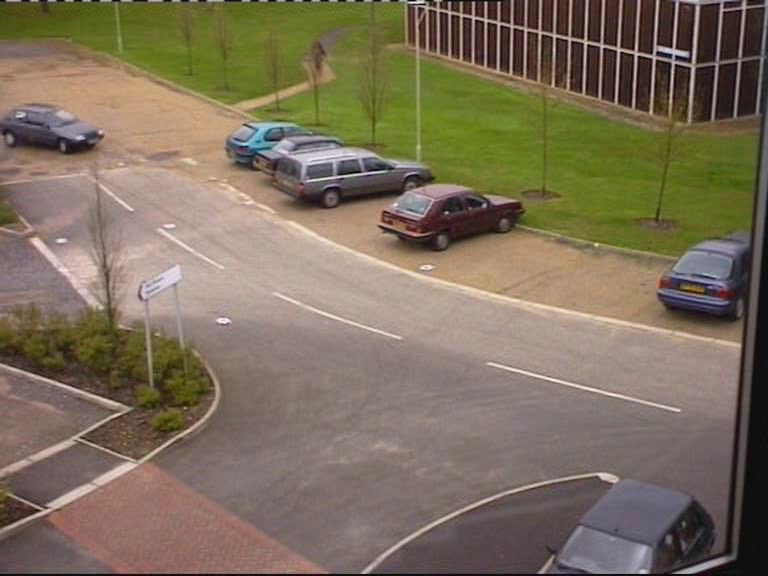

forged 20


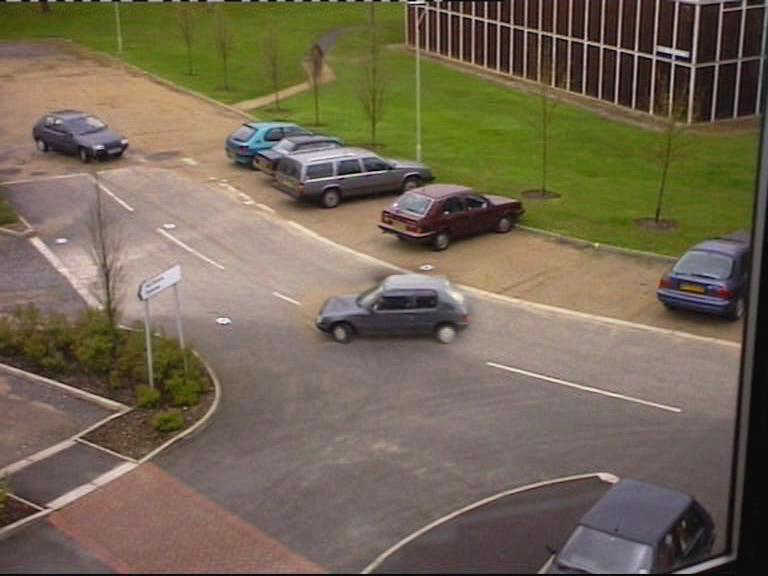

original 20
forged 21
forged 30


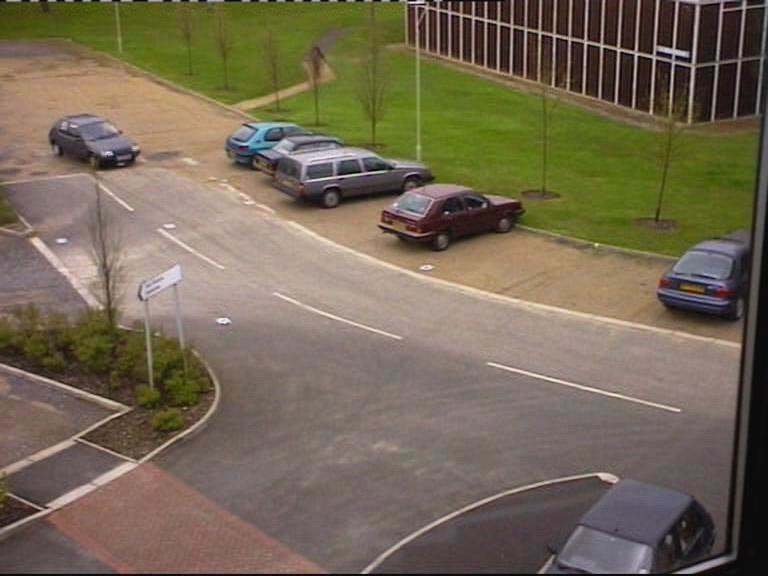

forged 31
original 43


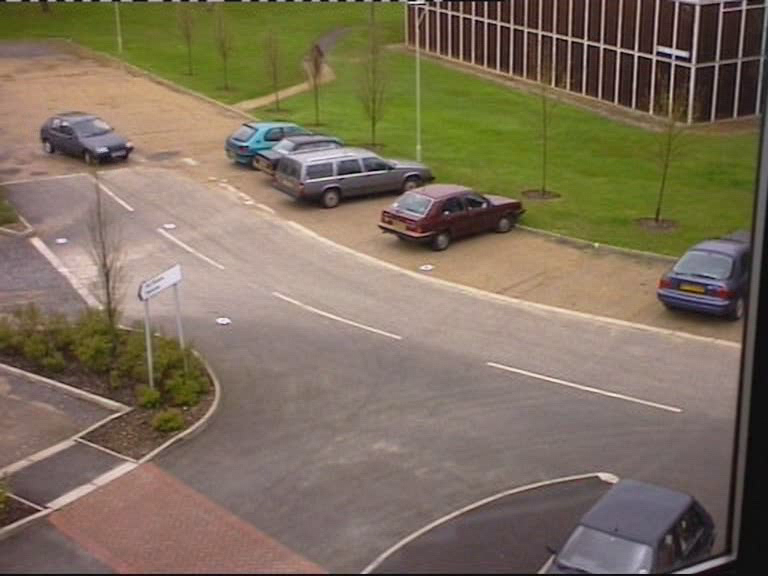

original 44
original 47


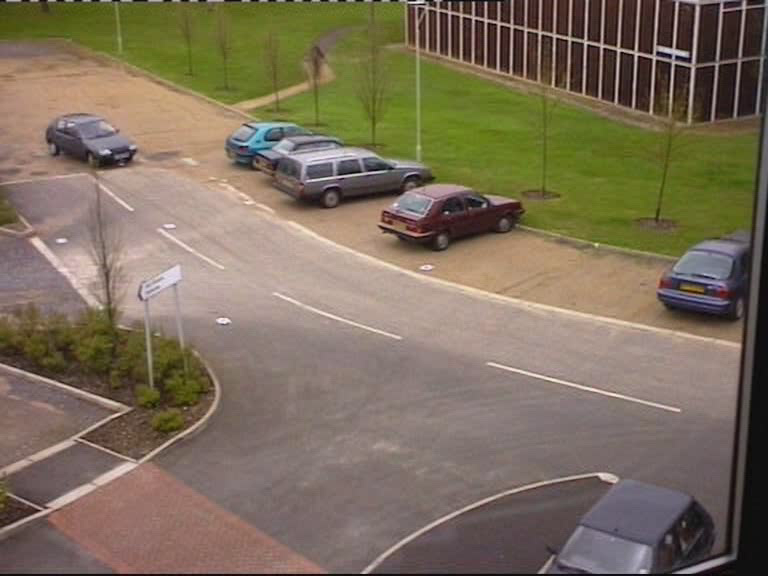

original 48
forged 65


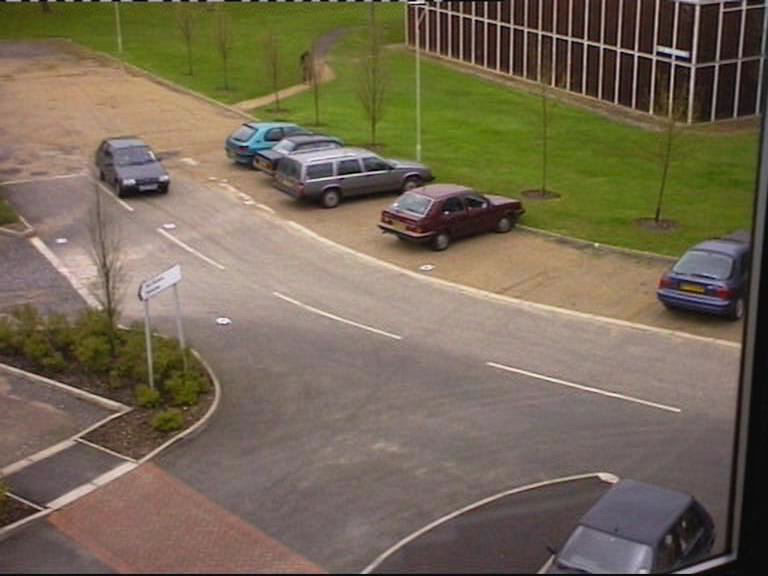

forged 66
original 90


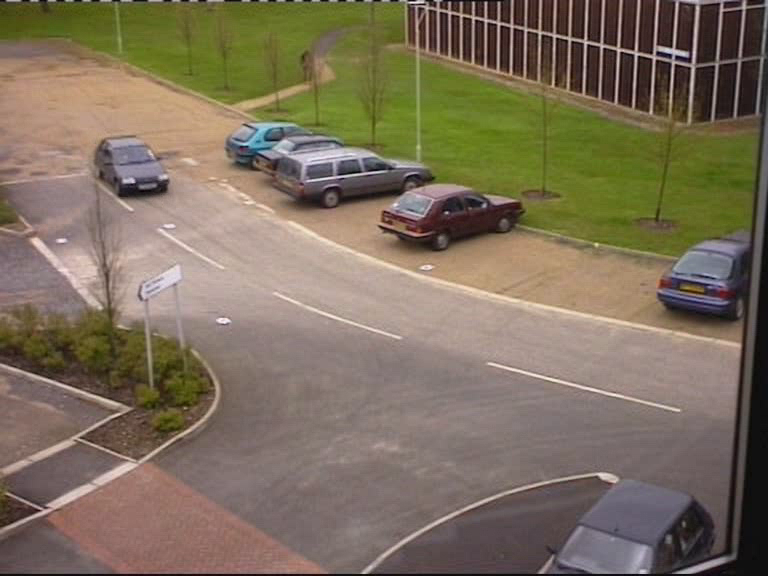

original 91


In [ ]:
original_frames,forged_frames = store_frames("video_pro2.avi","v_out_4-2-2015-23-58-0.avi")

In [ ]:
print(len(original_frames),len(forged_frames))
x = np.array(original_frames)
y = np.array(forged_frames)
print(x.shape,y.shape)

8 8
(8, 576, 768, 3) (8, 576, 768, 3)


In [ ]:
import pickle
with open("original_frames.txt", "wb") as fp:
  pickle.dump(np.array(original_frames), fp)
with open("forged_frames.txt", "wb") as fp:
  pickle.dump(np.array(forged_frames), fp)

In [5]:
import pickle
with open("original_frames.txt", "rb") as fp:
  real = pickle.load(fp)
with open("forged_frames.txt", "rb") as fp:
  forge = pickle.load(fp)
print(real.shape,forge.shape)

(8, 576, 768, 3) (8, 576, 768, 3)


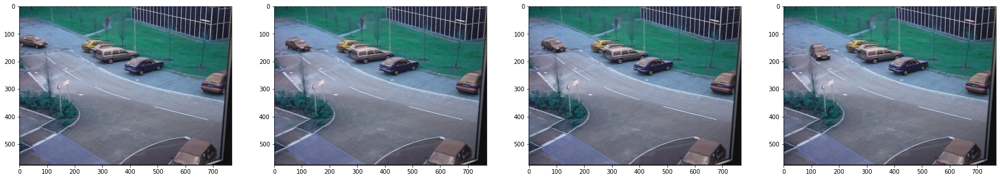

In [8]:
plt.figure(figsize=(30,60))
for i in range(0,4):
  if(i==0):
    plt.subplot(141)
    plt.imshow(real[i])
  else:
    x = 140+i+1
    plt.subplot(x)
    plt.imshow(real[i+i])
plt.show()

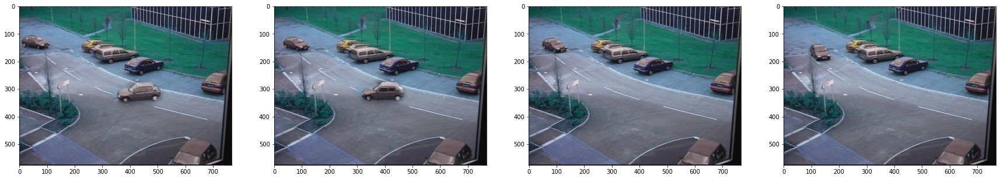

In [9]:
plt.figure(figsize=(30,60))
for i in range(0,4):
  if(i==0):
    plt.subplot(141)
    plt.imshow(forge[i])
  else:
    x = 140+i+1
    plt.subplot(x)
    plt.imshow(forge[i+i])
plt.show()

In [ ]:
frame_features = []
for k in range(0,real.shape[0],2):
  prev = real[k]
  next = real[k+1]
  # cv2_imshow(prev)
  # cv2_imshow(next)
  prev_gray =cv2.cvtColor(prev,cv2.COLOR_BGR2GRAY)
  next_gray = cv2.cvtColor(next,cv2.COLOR_BGR2GRAY)
  print(k)
  # Now do block-wise
  count = 0
  block_features = []
  for i in range(0,prev_gray.shape[0],8):
    for j in range(0,prev_gray.shape[1],8):
      if((i+128)<=prev_gray.shape[0] and (j+128)<=prev_gray.shape[1]):
        current_block_features = []
        # count+=1
        # print(count, end=' ')
        current_block = prev_gray[i:i+128,j:j+128]
        next_frame_current_block = next_gray[i:i+128,j:j+128]
        # Block-wise Co-occurences
        row_sco,col_sco = cal_statistical(current_block)
        current_block_features.append(row_sco)
        current_block_features.append(col_sco)
        # Block-wise optical Flow
        flow = cv2.calcOpticalFlowFarneback(current_block,next_frame_current_block,None,0.5,3,15,3,5,1.2,0)
        mag,ang = cv2.cartToPolar(flow[...,0],flow[...,1])
        current_block_features.append(mag)
        current_block_features.append(ang)
        block_features.append(current_block_features)
  # frame_row_sco,frame_col_sco = cal_statistical(next_gray)
  # print(frame_row_sco,frame_col_sco)
  frame_features.append(block_features)

0
2
4
6


In [ ]:
import pickle
with open("original_frames_blockwise_list.txt", "wb") as fp1:
  pickle.dump(frame_features, fp1)
with open("original_frames_blockwise_array.txt", "wb") as fp2:
  pickle.dump(np.array(frame_features), fp2)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  """


In [ ]:
import pickle
with open("original_frames_blockwise_list.txt", "rb") as fp3:
  blcl = pickle.load(fp3)
with open("original_frames_blockwise_array.txt", "rb") as fp4:
  blca = pickle.load(fp4)
print(len(blcl),blca.shape)

4 (4, 4617, 4)


In [ ]:
import pickle
with open("original_frames_blockwise_list.txt", "rb") as fp3:
  ori = pickle.load(fp3)
with open("forged_frames_blockwise_list.txt", "rb") as fp4:
  forg = pickle.load(fp4)

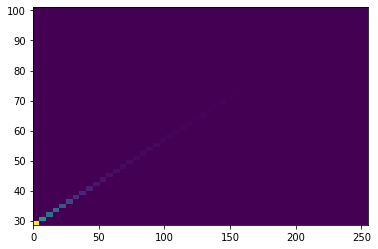

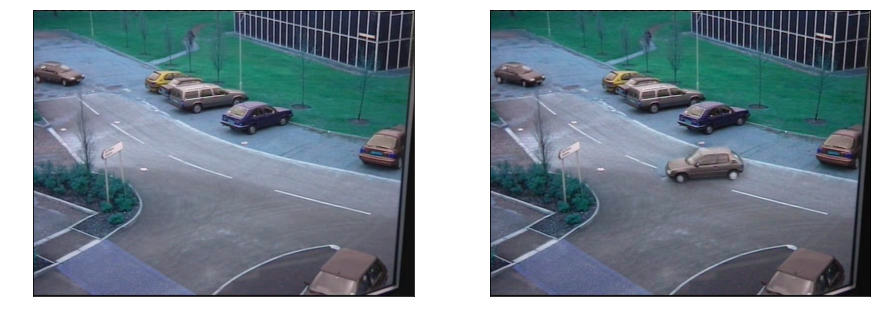

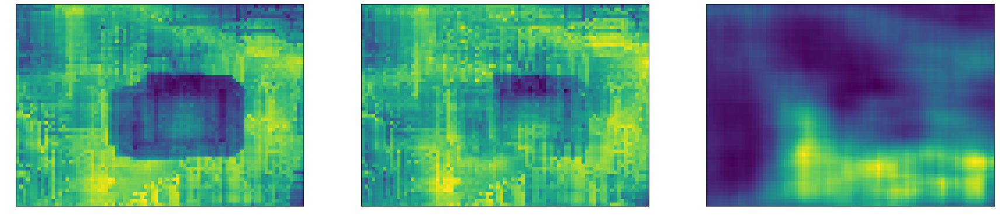

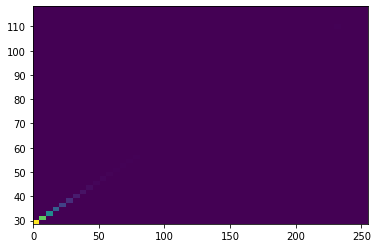

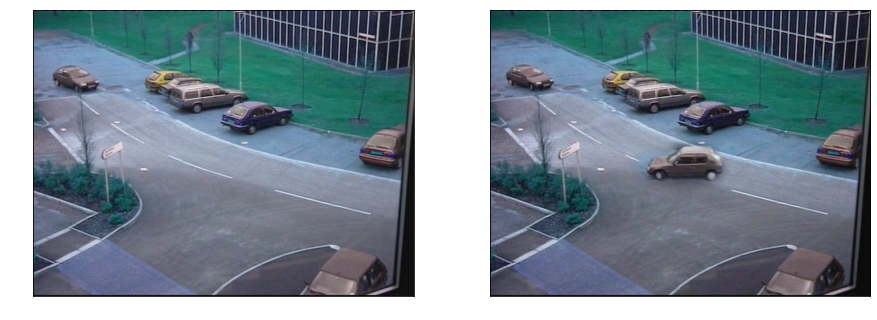

...

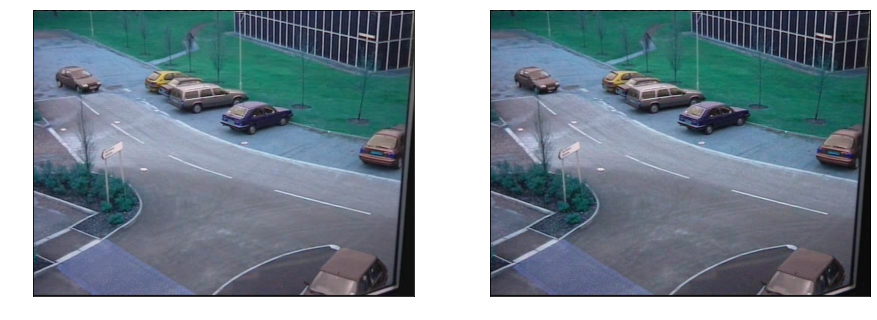

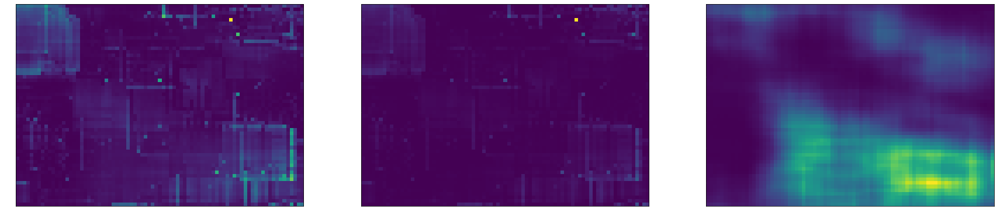

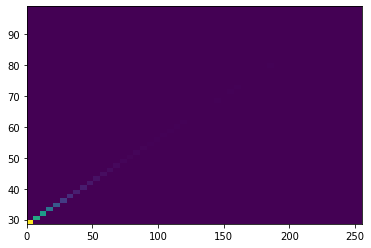

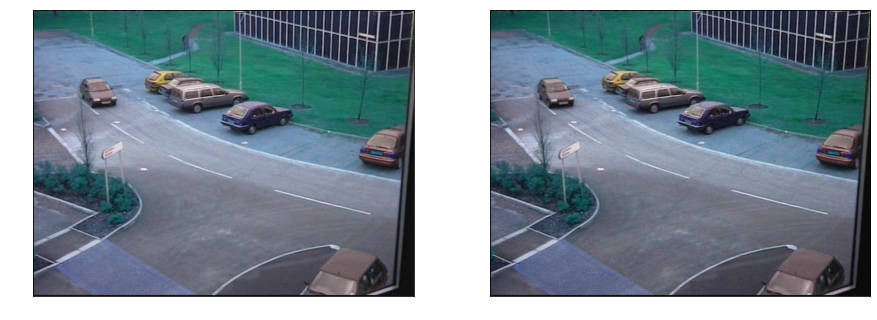

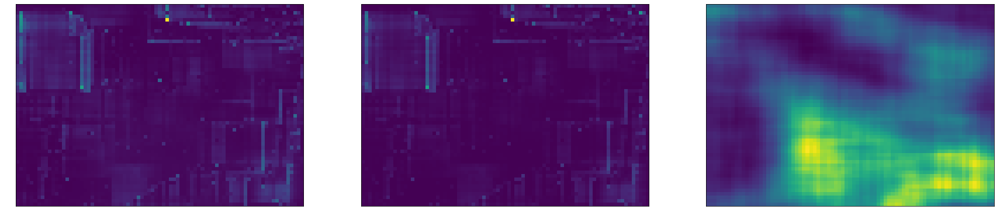

In [ ]:
for i in range(0,4):
  error1 = []
  error2 = []
  error3 = []
  for j in range(0,len(ori[0])):
    error1.append(euc_dist_3(ori[i][j],forg[i][j]))
    error2.append(euc_dist_2(ori[i][j],forg[i][j]))
    error3.append(euc_dist(ori[i][j],forg[i][j]))
  mse_norm_1 = 255.*(error1 - np.min(error1))/np.ptp(error1)
  mse_norm_1_int = mse_norm_1.astype(int)
  x = mse_norm_1_int.reshape(57,81)
  mse_norm_2 = 255.*(error2 - np.min(error2))/np.ptp(error2)
  mse_norm_2_int = mse_norm_2.astype(int)
  y = mse_norm_2_int.reshape(57,81)
  mse_norm_3 = 255.*(error3 - np.min(error3))/np.ptp(error3)
  mse_norm_3_int = mse_norm_3.astype(int)
  z = mse_norm_3_int.reshape(57,81)
  plt.figure(figsize=(15,30))
  plt.subplot(121)
  plt.imshow(real[i+i])
  plt.tick_params(colors='w')
  plt.subplot(122)
  plt.imshow(forge[i+i])
  plt.tick_params(colors='w')
  plt.show()
  plt.figure(figsize=(30,45))
  plt.subplot(131)
  plt.imshow(x)
  plt.tick_params(colors='w')
  plt.subplot(132)
  plt.imshow(y)
  plt.tick_params(colors='w')
  plt.subplot(133)
  plt.imshow(z)
  plt.tick_params(colors='w')
  plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error
def euc_dist_3(ft_1,ft_2):
  f1 = []
  f2 = []
  count = 0
  # bins = np.linspace(0, 720*(1280-4+1), 101)
  # bins = np.linspace(0, 720*(1280-4+1), 101)
  for i in ft_1:
      count = count + 1
      if(count<=2):
        for k,v in i.items():
          f1.append(v)
      if(count>=3):
        mag = i
        ang = i+1
        ang_norm = ang*180/np.pi/2
        mag_norm = cv2.normalize(mag,None,0,255,cv2.NORM_MINMAX)
        x = plt.hist2d(mag_norm.reshape(-1),ang_norm.reshape(-1), bins = 20)
        y = x[0].reshape(-1)
        z = y.tolist()
        f1.extend(z)
        break
  count = 0
  for i in ft_2:
      count = count + 1
      if(count<=2):
        for k,v in i.items():
          f2.append(v)
      if(count>=3):
        mag = i
        ang = i+1
        ang_norm = ang*180/np.pi/2
        mag_norm = cv2.normalize(mag,None,0,255,cv2.NORM_MINMAX)
        x = plt.hist2d(mag_norm.reshape(-1),ang_norm.reshape(-1), bins = 20)
        y = x[0].reshape(-1)
        z = y.tolist()
        f2.extend(z)
        #f2.append(z[0].reshape(-1))
        break
  #print(len(f1))
  #print(len(f2))
  f1_vec = np.array(f1)
  f2_vec = np.array(f2)
  # res_1 = plt.hist(f1_vec,bins=bins)
  # res_2 = plt.hist(f2_vec,bins=bins)
  #print(res_1[0])
  #print(res_2[0])
  #print(res_1.shape,res_2.shape)
  #f1_f2 = np.stack((f1_vec,f2_vec),axis=1)
  #print(f1_f2.shape)
  #print(f1_vec,f2_vec)
  mse = mean_squared_error(f1_vec,f2_vec)
  # mse = mean_squared_error(res_1[0], res_2[0])
  #print(mse)
  #print(f1_vec.shape,f2_vec.shape)
  #return
  return mse

In [ ]:
from sklearn.metrics import mean_squared_error
def euc_dist_2(ft_1,ft_2):
  f1 = []
  f2 = []
  count = 0
  # bins = np.linspace(0, 720*(1280-4+1), 101)
  # bins = np.linspace(0, 720*(1280-4+1), 101)
  for i in ft_1:
      count = count + 1
      if(count>=3):
        mag = i
        ang = i+1
        ang_norm = ang*180/np.pi/2
        mag_norm = cv2.normalize(mag,None,0,255,cv2.NORM_MINMAX)
        z = plt.hist2d(mag_norm.reshape(-1),ang_norm.reshape(-1), bins = 50)
        f1 = z[0].reshape(-1)
        break
  count = 0
  for i in ft_2:
      count = count + 1
      if(count>=3):
        mag = i
        ang = i+1
        ang_norm = ang*180/np.pi/2
        mag_norm = cv2.normalize(mag,None,0,255,cv2.NORM_MINMAX)
        z = plt.hist2d(mag_norm.reshape(-1),ang_norm.reshape(-1), bins = 50)
        f2 = z[0].reshape(-1)
        break
  #print(len(f1))
  #print(len(f2))
  f1_vec = np.array(f1)
  f2_vec = np.array(f2)
  # res_1 = plt.hist(f1_vec,bins=bins)
  # res_2 = plt.hist(f2_vec,bins=bins)
  #print(res_1[0])
  #print(res_2[0])
  #print(res_1.shape,res_2.shape)
  #f1_f2 = np.stack((f1_vec,f2_vec),axis=1)
  #print(f1_f2.shape)
  #print(f1_vec,f2_vec)
  mse = mean_squared_error(f1_vec,f2_vec)
  # mse = mean_squared_error(res_1[0], res_2[0])
  #print(mse)
  #print(f1_vec.shape,f2_vec.shape)
  #return
  return mse

In [ ]:
from sklearn.metrics import mean_squared_error
def euc_dist(ft_1,ft_2):
  f1 = []
  f2 = []
  count = 0
  # bins = np.linspace(0, 720*(1280-4+1), 101)
  # bins = np.linspace(0, 720*(1280-4+1), 101)
  for i in ft_1:
      for k,v in i.items():
        f1.append(v)
      count = count + 1
      if(count==2):
        break 
  count = 0
  for i in ft_2:
      for k,v in i.items():
        f2.append(v)
      count = count + 1
      if(count==2):
        break 
  #print(len(f1))
  #print(len(f2))
  f1_vec = np.array(f1)
  f2_vec = np.array(f2)
  # res_1 = plt.hist(f1_vec,bins=bins)
  # res_2 = plt.hist(f2_vec,bins=bins)
  #print(res_1[0])
  #print(res_2[0])
  #print(res_1.shape,res_2.shape)
  #f1_f2 = np.stack((f1_vec,f2_vec),axis=1)
  #print(f1_f2.shape)
  mse = mean_squared_error(f1_vec,f2_vec)
  # mse = mean_squared_error(res_1[0], res_2[0])
  #print(mse)
  #print(f1_vec.shape,f2_vec.shape)
  #return
  return mse

In [ ]:
def video_processing(video_file,frames):
  cap = cv2.VideoCapture(video_file)
  length = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
  width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
  height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
  fps    = cap.get(cv2.CAP_PROP_FPS)
  print('Frames: ',length,'height: ',height,'width: ',width,'fps: ', fps)

  #n_frames = frames

  
  ret, frame1 = cap.read()

  prvs = cv2.cvtColor(frame1,cv2.COLOR_BGR2GRAY)
  hsv = np.zeros_like(frame1)
  hsv[...,1] = 255

  count = 0
  features = []
  while(1):
    current_frame_features = []
    ret,frame2 = cap.read()
    if(ret is False):# or count==n_frames):
      break
    elif(count % frames==0):
      next = cv2.cvtColor(frame2,cv2.COLOR_BGR2GRAY)
      flow = cv2.calcOpticalFlowFarneback(prvs,next,None,0.5,3,15,3,5,1.2,0)
      mag,ang = cv2.cartToPolar(flow[...,0],flow[...,1])
      hsv[...,0] = ang*180/np.pi/2
      hsv[...,2] = cv2.normalize(mag,None,0,255,cv2.NORM_MINMAX)
      rgb = cv2.cvtColor(hsv,cv2.COLOR_HSV2BGR)
      #cv2_imshow(rgb)
      prvs = next
       
      print(count)
      # Nomalising mag and anf between -2 to 2
      mag_norm = (4.*(mag - np.min(mag))/np.ptp(mag)-2).astype(int)
      ang_norm = (4.*(ang - np.min(ang))/np.ptp(ang)-2).astype(int)
      
      mag_row_sco,mag_col_sco = cal_statistical(mag_norm)
      ang_row_sco,ang_col_sco = cal_statistical(ang_norm)
      frame_row_sco,frame_col_sco = cal_statistical(next)
      current_frame_features.append(frame_row_sco)
      current_frame_features.append(frame_col_sco)
      current_frame_features.append(ang_row_sco)
      current_frame_features.append(ang_col_sco)
      current_frame_features.append(mag_row_sco)
      current_frame_features.append(mag_col_sco)
    count = count + 1
    features.append(current_frame_features)
  cap.release()
  cv2.destroyAllWindows()

  return features



In [ ]:
from sklearn.metrics import mean_squared_error
def euc_dis_bin(ft_1,ft_2):
  f1 = []
  f2 = []
  count = 0
  bins = np.linspace(0, 720*(1280-4+1), 101)
  bins = np.linspace(0, 720*(1280-4+1), 101)
  for i in ft_1:
    if(count>=2):
      for k,v in i.items():
        f1.append(v)
    count = count + 1
      # if(count==2):
      #   break 
  count = 0
  for i in ft_2:
    if(count>=2):
      for k,v in i.items():
        f2.append(v)
    count = count + 1
    #if(count==2):
     # break 
  print(len(f1))
  print(len(f2))
  f1_vec = np.array(f1)
  f2_vec = np.array(f2)
  res_1 = plt.hist(f1_vec,bins=bins)
  res_2 = plt.hist(f2_vec,bins=bins)
  #print(res_1[0])
  #print(res_2[0])
  #print(res_1.shape,res_2.shape)
  #f1_f2 = np.stack((f1_vec,f2_vec),axis=1)
  #print(f1_f2.shape)
  mse = mean_squared_error(res_1[0], res_2[0])
  #print(mse)
  #print(f1_vec.shape,f2_vec.shape)
  #return
  return mse

In [ ]:
from sklearn.metrics import mean_squared_error
def euc_dis(ft_1,ft_2):
  f1 = []
  f2 = []
  count = 0
  
  for i in ft_1:
    if(count>=2):
      for k,v in i.items():
        f1.append(v)
    count = count + 1
    # if(count==2):
    #   break 
  count = 0
  for i in ft_2:
    if(count>=2):
      for k,v in i.items():
        f2.append(v)
    count = count + 1
    #if(count==2):
     # break 
  print(len(f1))
  print(len(f2))
  f1_vec = np.array(f1)
  f2_vec = np.array(f2)
  #f1_f2 = np.stack((f1_vec,f2_vec),axis=1)
  #print(f1_f2.shape)
  mse = mean_squared_error(f1_vec, f2_vec)
  print(mse)
  #print(f1_vec.shape,f2_vec.shape)
  return mse

In [ ]:
from scipy.spatial import distance
def maha_distance(frame1_ft,frame2_ft):
  f1 = []
  f2 = []
  for i in frame1_ft:
    for k,v in i.items():
      f1.append(v) 
  for i in frame2_ft:
    for k,v in i.items():
      f2.append(v)
  print(len(f1))
  print(len(f2))
  f1_vec = np.array(f1)
  f2_vec = np.array(f2)
  f1_f2 = np.stack((f1_vec,f2_vec),axis=1)
  print(f1_f2.shape)

  cov_f1_f2 = np.cov(f1_f2)
  print(cov_f1_f2.shape)
  print(cov_f1_f2)
  #in_cov = np.linalg.inv(cov_f1_f2)
  #print()
  # dis = distance.mahalanobis(f1_vec,f2_vec,in_cov)
  # print(dis)
  return 
  # for k,v in r1.items():
  #   f1.append(v)
  # #print(f1)
  # for k,v in c1.items():
  #   f1.append(v)
  # #print(f1)
  # for k,v in r2.items():
  #   f2.append(v)
  # #print(f2)
  # for k,v in c2.items():
  #   f2.append(v)
  #print(f2)
  # f1_vec = np.array(f1)
  # #f1_vec = f1_vec.reshape(f1_vec.shape[0],1)
  # f2_vec = np.array(f2)
  # #f2_vec = f2_vec.reshape(f2_vec.shape[0],1)
  # #print(f1_vec,f2_vec)
  # print(f1_vec.shape,f2_vec.shape)

  # f1_f2 = np.stack((f1_vec,f2_vec),axis=1)
  # print(f1_f2.shape)
  # #print(f1_f2)
  # cov_f1_f2 = np.cov(f1_f2)
  # print(cov_f1_f2.shape)
  # in_cov = np.linalg.inv(cov_f1_f2)
  #print()
  # dis = distance.mahalanobis(f1_vec,f2_vec,in_cov)
  # print(dis)

In [ ]:
def print_statistics(video1,video2,frames):
  cap1 = cv2.VideoCapture(video1)
  cap2 = cv2.VideoCapture(video2)
  ret1, frame1 = cap1.read()
  ret2, frame2 = cap2.read()
  count = 0
  while(1):
    ret1, frame1 = cap1.read()
    ret2, frame2 = cap2.read()
    if(ret1 is False or ret2 is False or count==frames):
      break
    else:
      plt.figure(figsize=(15,30))
      plt.subplot(121)
      plt.imshow(frame1)
      plt.subplot(122)
      plt.imshow(frame2)
      plt.show()
    
    count = count + 1

  cap1.release()
  cap2.release
  cv2.destroyAllWindows()
  return


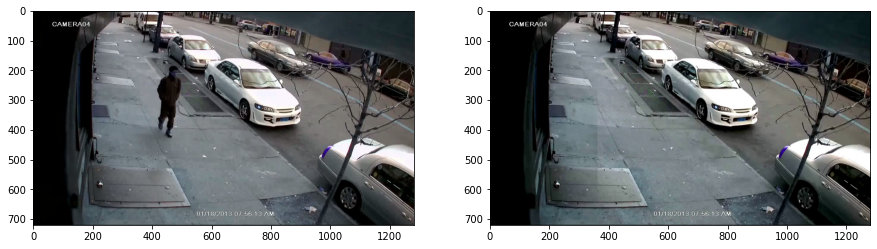

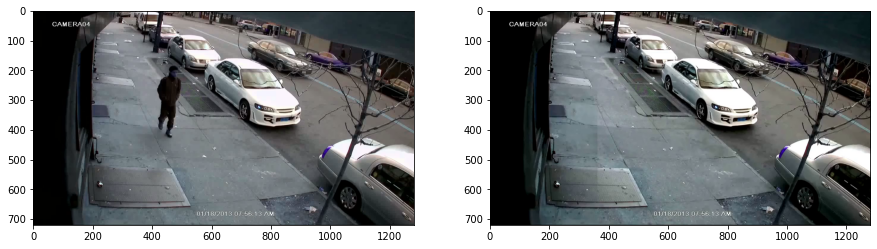

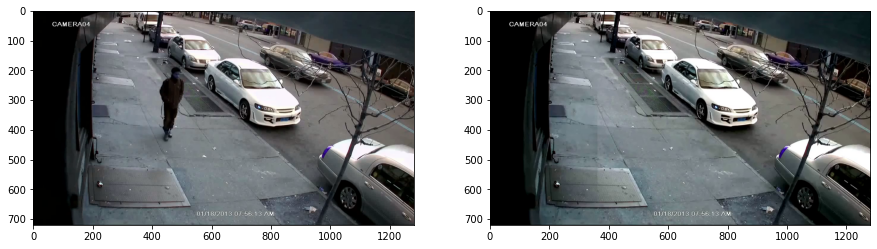

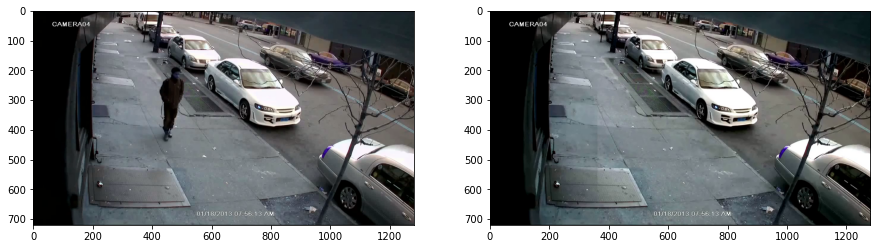

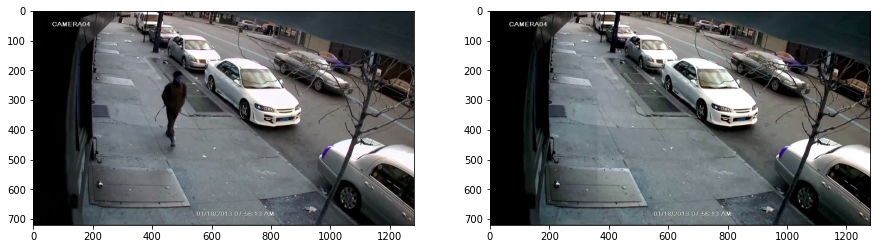

In [ ]:
print_statistics('Realman street_10_5.mp4','Forgeryman street_10_5.mp4',5)

In [ ]:
print(len(b))
print(len(b[0]))
print(len(b[0][0]))

30
6
325


In [ ]:
import numpy as np

a = np.random.rand(3,2)

# # Normalised [0,1]
# b = (a - np.min(a))/np.ptp(a)

# # Normalised [0,255] as integer: don't forget the parenthesis before astype(int)
# c = (255*(a - np.min(a))/np.ptp(a)).astype(int)        

# Normalised [-1,1]
d = 4.*(a - np.min(a))/np.ptp(a)-2
e = np.ceil(d)
print(a)
print(d)
print(e)

[[0.05086758 0.96038551]
 [0.35603557 0.41642603]
 [0.33765157 0.4191638 ]]
[[-2.          2.        ]
 [-0.65789129 -0.39229802]
 [-0.7387429  -0.38025748]]
[[-2.  2.]
 [-0. -0.]
 [-0. -0.]]


In [ ]:
cap = cv2.VideoCapture("Real man street.mp4")
length = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps    = cap.get(cv2.CAP_PROP_FPS)

print(length,width,height,fps)

ret, frame1 = cap.read()
# print(frame1.shape)
# cv2_imshow(frame1)
prvs = cv2.cvtColor(frame1,cv2.COLOR_BGR2GRAY)
# print(prvs.shape)
# cv2_imshow(prvs)
hsv = np.zeros_like(frame1)
hsv[...,1] = 255

count = 0

frames_row_residuals_co_occurences = []
frames_column_residuals_co_occurences = []
while(1):
    ret, frame2 = cap.read()
    if(ret is False):
      break

    next = cv2.cvtColor(frame2,cv2.COLOR_BGR2GRAY)
    if( count%1 == 0):
      flow = cv2.calcOpticalFlowFarneback(prvs,next, None, 0.5, 3, 15, 3, 5, 1.2, 0)

      flow1 = np.zeros((flow.shape[0], flow.shape[1],flow.shape[2]))

      normalizedImg = cv2.normalize(flow,  None, 0, 255, cv2.NORM_MINMAX)

      #flows.append(flow1)

      # # Caculating row-wise
      # f_row_residuals = find_residuals(prvs,hpf,2,3)
      # f_row_residuals_i = f_row_residuals.astype('int')
      # f_row_residuals_co_occurences = count_co_occurences(f_row_residuals_i,residual_values,4)
      # frames_row_residuals_co_occurences.append(f_row_residuals_co_occurences)
      # #Calculating column wise
      # f_column_residuals = np.transpose(find_residuals(np.transpose(prvs),hpf,2,3))
      # f_column_residuals_i = f_column_residuals.astype('int')
      # f_column_residuals_co_occurences = count_co_occurences(f_column_residuals_i,residual_values,4)
      # frames_column_residuals_co_occurences.append(f_column_residuals_co_occurences)
      #print(flow.shape)

      mag, ang = cv2.cartToPolar(flow[...,0], flow[...,1])
      print(mag)
      print(ang)
      #print(mag.shape,ang.shape)
      hsv[...,0] = ang*180/np.pi/2
      hsv[...,2] = cv2.normalize(mag,None,0,255,cv2.NORM_MINMAX)
      #flows_original.append(hsv[...,2])
      rgb = cv2.cvtColor(hsv,cv2.COLOR_HSV2BGR)

      #cv2_imshow(rgb)
      # g = cv2.waitKey(30)
      # print(g)
      # k = g & 0xff
      
      # if k == 27:
      #   print("breaking")
      #   break
      # # elif k == ord('s'):
      # #     cv2.imwrite('opticalfb.png',frame2)
      # #     cv2.imwrite('opticalhsv.png',rgb)
      prvs = next
      #cv2_imshow(prvs)
    count = count +1
    #print(count)
cap.release()
cv2.destroyAllWindows()

451 1280 720 29.97002997002997
[[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.6308632e-05
  1.3462467e-05 1.2687986e-05]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.0304921e-05
  8.5855036e-06 7.8615167e-06]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.7992961e-06
  1.4974013e-06 1.3488292e-06]
 ...
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 7.5848750e-03
  3.3126373e-03 2.4609778e-03]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 5.3214962e-03
  2.6297006e-03 1.4063241e-03]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 2.9793798e-03
  1.5700619e-03 5.9360592e-04]]
[[0.         0.         0.         ... 1.7148528  1.835162   1.9248022 ]
 [0.         0.         0.         ... 1.6495097  1.7523825  1.8637226 ]
 [0.         0.         0.         ... 1.5946746  1.6788065  1.7951087 ]
 ...
 [4.712389   4.712389   4.712389   ... 6.0977716  0.22333837 0.22723413]
 [4.712389   4.712389   4.712389   ... 6.1927204  0.12912832 0.1647495 ]
 [4.712389   4.712389   4.712389   

KeyboardInterrupt: ignored

In [ ]:
cap1 = cv2.VideoCapture("Real man street.mp4")

length1 = int(cap1.get(cv2.CAP_PROP_FRAME_COUNT))
width1  = int(cap1.get(cv2.CAP_PROP_FRAME_WIDTH))
height1 = int(cap1.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps1    = cap1.get(cv2.CAP_PROP_FPS)

print(length1,width1,height1,fps1)

ret1, frame11 = cap1.read()
cap1.release()

cap2 = cv2.VideoCapture("Forgery man street.mp4")
length2 = int(cap2.get(cv2.CAP_PROP_FRAME_COUNT))
width2  = int(cap2.get(cv2.CAP_PROP_FRAME_WIDTH))
height2 = int(cap2.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps2    = cap2.get(cv2.CAP_PROP_FPS)

print(length2,width2,height2,fps2)

ret2, frame21 = cap2.read()
cap2.release()


451 1280 720 29.97002997002997
452 1280 720 30.0


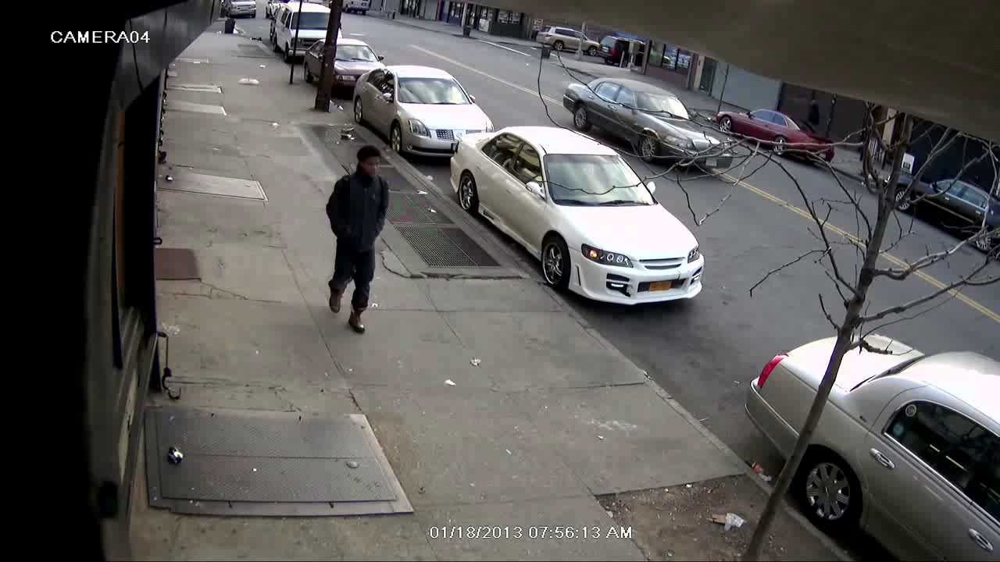

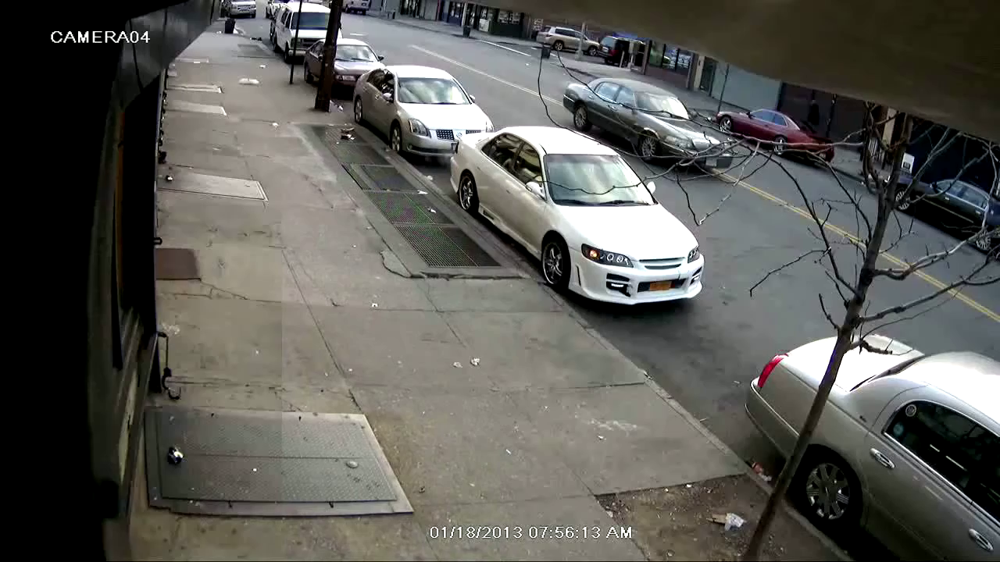

In [ ]:
cv2_imshow(frame11)
cv2_imshow(frame21)

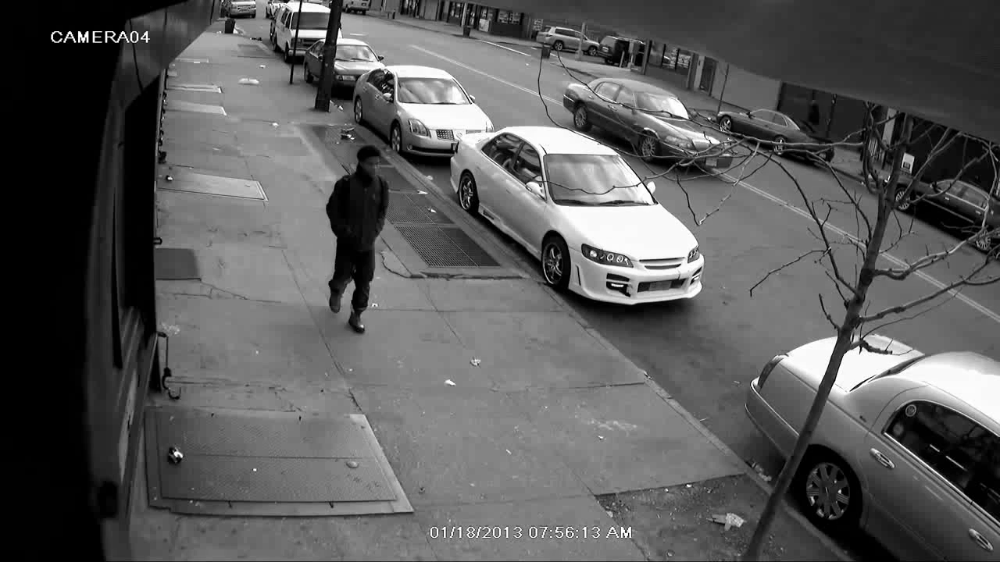

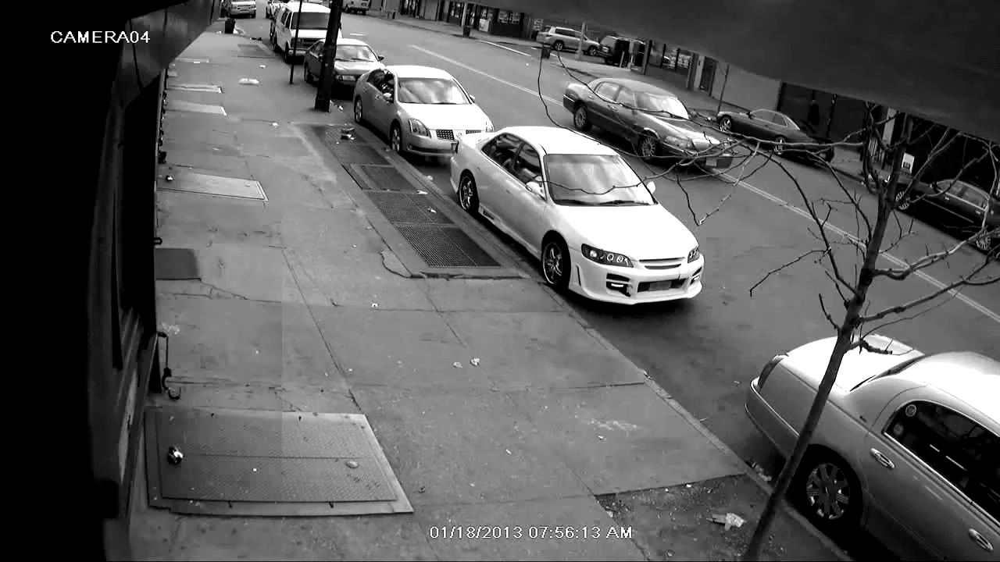

In [ ]:
gr_frm11 = cv2.cvtColor(frame11,cv2.COLOR_BGR2GRAY)
gr_frm21 = cv2.cvtColor(frame21,cv2.COLOR_BGR2GRAY)
cv2_imshow(gr_frm11)
cv2_imshow(gr_frm21)

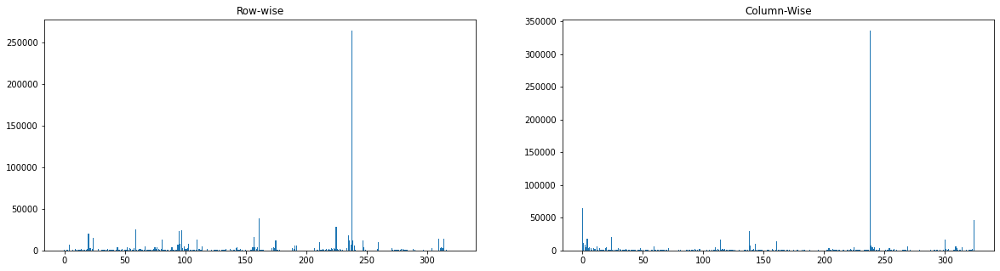

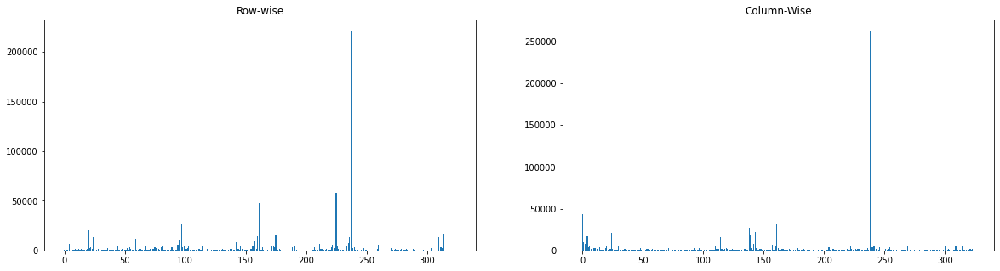

In [ ]:
row_cos11,col_cos11 = cal_histograms(gr_frm11)
row_cos21,col_cos21 = cal_histograms(gr_frm21)

In [ ]:
from scipy.spatial import distance
def maha_distance(r1,r2,c1,c2):
  f1 = []
  f2 = []
  for k,v in r1.items():
    f1.append(v)
  #print(f1)
  for k,v in c1.items():
    f1.append(v)
  #print(f1)
  for k,v in r2.items():
    f2.append(v)
  #print(f2)
  for k,v in c2.items():
    f2.append(v)
  #print(f2)
  f1_vec = np.array(f1)
  #f1_vec = f1_vec.reshape(f1_vec.shape[0],1)
  f2_vec = np.array(f2)
  #f2_vec = f2_vec.reshape(f2_vec.shape[0],1)
  #print(f1_vec,f2_vec)
  print(f1_vec.shape,f2_vec.shape)

  f1_f2 = np.stack((f1_vec,f2_vec),axis=1)
  print(f1_f2.shape)
  #print(f1_f2)
  cov_f1_f2 = np.cov(f1_f2)
  print(cov_f1_f2.shape)
  in_cov = np.linalg.inv(cov_f1_f2)
  #print()
  # dis = distance.mahalanobis(f1_vec,f2_vec,in_cov)
  # print(dis)

In [ ]:
maha_distance(row_cos11,row_cos21,col_cos11,col_cos21)

(650,) (650,)
(650, 2)
(650, 650)


LinAlgError: ignored